In [1]:
import pandas as pd
import numpy as np
import math
from bokeh.io import output_notebook
import panel as pn
pn.extension()
from bokeh.plotting import figure, show, output_file, save
from bokeh.layouts import gridplot
from bokeh.plotting import ColumnDataSource
from bokeh.models import Tabs, panels
import itertools
from datetime import datetime
import matplotlib.pyplot as plt
import hvplot.pandas
import holoviews as hv
from matplotlib.dates import DateFormatter
import scipy.signal
from bokeh.io import curdoc, show
from bokeh.models import ColumnDataSource, Grid, Line, LinearAxis, Plot
from bokeh.models import ColumnDataSource, Band
from bokeh.transform import jitter
import scipy
from bokeh.models import Span
import seaborn as sns
from scipy.interpolate import interp1d, splrep, splev
import matplotlib.dates as mdates
import matplotlib.cbook as cbook
from scipy import stats
from scipy.stats import norm
from bokeh.models import Legend, LegendItem
from scipy.stats import bartlett
from scipy.stats import levene
import ipywidgets as widgets
from ipywidgets import interact, interact_manual
import pingouin as pg
from holoviews import opts
import folium
from folium.features import DivIcon

output_notebook()

Loading BokehJS ...

In [2]:
df = pd.read_csv("master.csv")
df.tail(2)

,country,year,sex,age,suicides_no,population,suicides/100k pop,country-year,HDI for year,gdp_for_year ($),gdp_per_capita ($),generation
27818,Uzbekistan,2014,female,5-14 years,44,2631600,1.67,Uzbekistan2014,0.675,"63,067,077,179",2309,Generation Z
27819,Uzbekistan,2014,female,55-74 years,21,1438935,1.46,Uzbekistan2014,0.675,"63,067,077,179",2309,Boomers


In [3]:
df.columns

Index(['country', 'year', 'sex', 'age', 'suicides_no', 'population',
       'suicides/100k pop', 'country-year', 'HDI for year',
       ' gdp_for_year ($) ', 'gdp_per_capita ($)', 'generation'],
      dtype='object')

### I deleted generation because it depends on the birth year, and nan values are not fillable with age groups.

In [4]:
df.drop(['HDI for year', ' gdp_for_year ($) ', 'suicides_no', 'population', 'country-year', 'generation'], axis=1, inplace=True)
df = df[df.year > 2000]
df.head(2)

,country,year,sex,age,suicides/100k pop,gdp_per_capita ($)
144,Albania,2001,male,25-34 years,10.65,1451
145,Albania,2001,male,35-54 years,8.98,1451


In [5]:
len(set(df.country)) * len(set(df.year))

1568

In [6]:
print(df.isna().sum())

country               0
year                  0
sex                   0
age                   0
suicides/100k pop     0
gdp_per_capita ($)    0
dtype: int64


In [7]:
df.dtypes

country                object
year                    int64
sex                    object
age                    object
suicides/100k pop     float64
gdp_per_capita ($)      int64
dtype: object

In [8]:
df = df.astype(dtype={'country': 'category', 'year': 'category', 'age': 'category',
                      'sex': 'category'})

df.dtypes

country               category
year                  category
sex                   category
age                   category
suicides/100k pop      float64
gdp_per_capita ($)       int64
dtype: object

In [9]:
#there is no data for some age groups or genders or specific years.
len(set(df.country)) * len(set(df.year)) * len(set(df.sex)) * len(set(df.age)) , len(df.index)

(18816, 15136)

In [10]:
y = list(set(df.year))
c = list(set(df.country))
a = list(set(df.age))
g = list(set(df.sex))

In [11]:
y.sort()
c.sort()

In [12]:
yy = np.repeat(y, len(c)* len(a) *len(g))
len(yy)

18816

In [13]:
cc =np.tile(np.repeat(c, len(g)* len(a)) , len(y))
len(cc)

18816

In [14]:
gg =np.tile(np.tile(np.tile(g, len(a)) , len(c)) , len(y))
len(gg)

18816

In [15]:
aa =np.tile(np.repeat(a, len(g)), len(c) * len(y))
len(aa)

18816

In [16]:
data = {"year": yy , "country" : cc , "sex" : gg , "age": aa}
cd = pd.DataFrame(data)
cd.head(2)

,year,country,sex,age
0,2001,Albania,male,15-24 years
1,2001,Albania,female,15-24 years


In [17]:
outer_merged = pd.merge(cd, df, how="outer", on=["year", "country","sex", "age" ])
outer_merged.head()

,year,country,sex,age,suicides/100k pop,gdp_per_capita ($)
0,2001,Albania,male,15-24 years,3.91,1451.0
1,2001,Albania,female,15-24 years,3.32,1451.0
2,2001,Albania,male,35-54 years,8.98,1451.0
3,2001,Albania,female,35-54 years,3.24,1451.0
4,2001,Albania,male,75+ years,3.22,1451.0


In [18]:
len(outer_merged.year)

18816

In [19]:
print(outer_merged.isna().sum())

year                     0
country                  0
sex                      0
age                      0
suicides/100k pop     3680
gdp_per_capita ($)    3680
dtype: int64


In [20]:
outer_merged["suicides/100k pop"].fillna(0, inplace = True)

In [21]:
print(outer_merged.isna().sum())

year                     0
country                  0
sex                      0
age                      0
suicides/100k pop        0
gdp_per_capita ($)    3680
dtype: int64


In [22]:
def fill_gdp(countryy, yearr):
    z = outer_merged.loc[(outer_merged.country== countryy) & (outer_merged.year== yearr)]['gdp_per_capita ($)'].to_list()
    return z

In [23]:
a = outer_merged.groupby(['country', 'year'])['gdp_per_capita ($)'].max().to_list()
a

[1451.0,
 1573.0,
 2021.0,
 2544.0,
 2931.0,
 3235.0,
 3863.0,
 4672.0,
 4387.0,
 4359.0,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 10468.0,
 10499.0,
 10878.0,
 11535.0,
 12649.0,
 14114.0,
 15775.0,
 16238.0,
 14335.0,
 nan,
 nan,
 13657.0,
 13287.0,
 14093.0,
 14853.0,
 nan,
 7900.0,
 2840.0,
 3668.0,
 4683.0,
 5590.0,
 6475.0,
 7918.0,
 9843.0,
 8961.0,
 11273.0,
 13946.0,
 14203.0,
 14206.0,
 13400.0,
 14981.0,
 nan,
 587.0,
 788.0,
 928.0,
 nan,
 nan,
 2310.0,
 3366.0,
 3829.0,
 3215.0,
 3460.0,
 3798.0,
 3773.0,
 3957.0,
 4142.0,
 3775.0,
 3788.0,
 22317.0,
 21987.0,
 22345.0,
 24133.0,
 24870.0,
 25622.0,
 27672.0,
 29447.0,
 26361.0,
 25974.0,
 27066.0,
 nan,
 nan,
 nan,
 nan,
 nan,
 20860.0,
 21474.0,
 25059.0,
 32454.0,
 nan,
 39014.0,
 43171.0,
 52315.0,
 45128.0,
 54887.0,
 66770.0,
 72669.0,
 72856.0,
 66809.0,
 60656.0,
 nan,
 25848.0,
 27772.0,
 33889.0,
 38711.0,
 40367.0,
 42698.0,
 49218.0,
 54294.0,
 50356.0,
 49181.0,
 53923.0,
 50979.0,
 53229.0,
 54278.0,
 46484.0,
 4

In [24]:
len(a) , len(set(outer_merged.country)) * len(set(outer_merged.year))

(1568, 1568)

In [25]:
aa = np.repeat(a, 12)
aa

array([1451., 1451., 1451., ...,   nan,   nan,   nan])

In [26]:
len(aa) , len(outer_merged.country)

(18816, 18816)

In [27]:
outer_merged['gdp'] = aa

In [28]:
print(outer_merged.isna().sum())

year                     0
country                  0
sex                      0
age                      0
suicides/100k pop        0
gdp_per_capita ($)    3680
gdp                   3648
dtype: int64


In [29]:
outer_merged.drop('gdp_per_capita ($)', inplace=True, axis=1)

In [30]:
outer_merged.sort_values(by=['country'], inplace=True)

In [31]:
new_df = outer_merged[outer_merged.sex == "male"]
omg = new_df.groupby('country').agg({"gdp": "mean"})
len(omg.gdp.to_list())

98

In [32]:
y = list(set(outer_merged.year))
a = list(set(outer_merged.age))
g = list(set(outer_merged.sex))
z = len(y) * len(a) * len(g)
gdppp = np.repeat(omg.gdp.to_list(), z)
gdppp

array([21962.93333333, 21962.93333333, 21962.93333333, ...,
       25595.66666667, 25595.66666667, 25595.66666667])

In [33]:
len(gdppp), len(outer_merged.year)

(18816, 18816)

In [34]:
outer_merged['gdp_mean'] = gdppp
outer_merged.tail(2)

,year,country,sex,age,suicides/100k pop,gdp,gdp_mean
11752,2010,Uzbekistan,male,75+ years,4.59,NaN,25595.666667
18815,2016,Uzbekistan,female,55-74 years,0.00,NaN,25595.666667


In [35]:
outer_merged['gdp_mean']  = outer_merged['gdp_mean'].apply(np.ceil)
outer_merged.tail(2)

,year,country,sex,age,suicides/100k pop,gdp,gdp_mean
11752,2010,Uzbekistan,male,75+ years,4.59,NaN,25596.0
18815,2016,Uzbekistan,female,55-74 years,0.00,NaN,25596.0


In [36]:
def fill_nan_gdp(x):
    if math.isnan(x['gdp']) == False:
        return x['gdp']
    else:
        return x['gdp_mean']

In [37]:
outer_merged['fgdp'] = outer_merged.apply(lambda x : x['gdp'] if  math.isnan(x['gdp']) == False else x['gdp_mean'], axis=1)

In [38]:
print(outer_merged.isna().sum())

year                    0
country                 0
sex                     0
age                     0
suicides/100k pop       0
gdp                  3648
gdp_mean                0
fgdp                    0
dtype: int64


In [39]:
outer_merged.drop(["gdp", "gdp_mean"], axis = 1, inplace=True)
outer_merged.head(2)

,year,country,sex,age,suicides/100k pop,fgdp
0,2001,Albania,male,15-24 years,3.91,1451.0
17648,2016,Albania,male,25-34 years,0.00,7326.0


In [40]:
outer_merged.rename(columns={'suicides/100k pop':'suicides', 'fgdp':'gdp'}, inplace=True)
outer_merged.head(2)

,year,country,sex,age,suicides,gdp
0,2001,Albania,male,15-24 years,3.91,1451.0
17648,2016,Albania,male,25-34 years,0.00,7326.0


In [41]:
fd = outer_merged.copy()
fd = fd.astype(dtype={'country': 'category', 'year': 'category', 'age': 'category',
                      'sex': 'category'})
fd.dtypes

year        category
country     category
sex         category
age         category
suicides     float64
gdp          float64
dtype: object

In [42]:
cf = pd.read_csv("concap.csv")
cf.tail(3)

,CountryName,CapitalName,CapitalLatitude,CapitalLongitude,CountryCode,ContinentName
242,Heard Island and McDonald Islands,NaN,0.0,0.0,HM,Antarctica
243,British Indian Ocean Territory,Diego Garcia,-7.3,72.4,IO,Africa
244,Macau,NaN,0.0,0.0,MO,Asia


In [43]:
cf.columns

Index(['CountryName', 'CapitalName', 'CapitalLatitude', 'CapitalLongitude',
       'CountryCode', 'ContinentName'],
      dtype='object')

In [44]:
cf.drop(["CapitalName", "CountryCode"], axis = 1, inplace=True)
cf.rename(columns={'CountryName':'country'}, inplace=True)
cf.head(2)

,country,CapitalLatitude,CapitalLongitude,ContinentName
0,Somaliland,9.550000,44.05,Africa
1,South Georgia and South Sandwich Islands,-54.283333,-36.50,Antarctica


In [45]:
outer_merged.head(2)

,year,country,sex,age,suicides,gdp
0,2001,Albania,male,15-24 years,3.91,1451.0
17648,2016,Albania,male,25-34 years,0.00,7326.0


In [46]:
print(cf.isna().sum())

country             0
CapitalLatitude     0
CapitalLongitude    0
ContinentName       0
dtype: int64


In [47]:
ffd = pd.merge(fd, cf, how="left", on="country")
ffd.head(5)

,year,country,sex,age,suicides,gdp,CapitalLatitude,CapitalLongitude,ContinentName
0,2001,Albania,male,15-24 years,3.91,1451.0,41.316667,19.816667,Europe
1,2016,Albania,male,25-34 years,0.00,7326.0,41.316667,19.816667,Europe
2,2016,Albania,female,25-34 years,0.00,7326.0,41.316667,19.816667,Europe
3,2016,Albania,male,55-74 years,0.00,7326.0,41.316667,19.816667,Europe
4,2016,Albania,female,55-74 years,0.00,7326.0,41.316667,19.816667,Europe


In [48]:
len(ffd.year)

18816

In [49]:
print(ffd.isna().sum())

year                  0
country               0
sex                   0
age                   0
suicides              0
gdp                   0
CapitalLatitude     768
CapitalLongitude    768
ContinentName       768
dtype: int64


In [50]:
ffd.rename(columns={'ContinentName':'continent'}, inplace=True)
ffd.head(2)

,year,country,sex,age,suicides,gdp,CapitalLatitude,CapitalLongitude,continent
0,2001,Albania,male,15-24 years,3.91,1451.0,41.316667,19.816667,Europe
1,2016,Albania,male,25-34 years,0.00,7326.0,41.316667,19.816667,Europe


In [51]:
ffd.dtypes

year                category
country               object
sex                 category
age                 category
suicides             float64
gdp                  float64
CapitalLatitude      float64
CapitalLongitude     float64
continent             object
dtype: object

In [52]:
ffd = ffd.astype(dtype={'country': 'category', 'continent': 'category'})
ffd.dtypes

year                category
country             category
sex                 category
age                 category
suicides             float64
gdp                  float64
CapitalLatitude      float64
CapitalLongitude     float64
continent           category
dtype: object

In [53]:
set(ffd[ffd.continent.isna() == True].country)

{'Cabo Verde',
 'Republic of Korea',
 'Russian Federation',
 'Saint Vincent and Grenadines'}

In [54]:
ffd.loc[ffd['country'] == 'Cabo Verde', "continent"] = "Africa"
ffd.loc[ffd['country'] == 'Republic of Korea', "continent"] = "Asia"
ffd.loc[ffd['country'] == 'Russian Federation', "continent"] = "Asia"
ffd.loc[ffd['country'] == 'Saint Vincent and Grenadines', "continent"] = "North America"

In [55]:
set(ffd[ffd.continent.isna() == True].country)

set()

## According to the below site I mapped gdp to gdp_level:
https://blogs.worldbank.org/opendata/new-world-bank-country-classifications-income-level-2020-2021

In [56]:
ffd['gdp_level'] = np.nan
ffd.loc[ffd.gdp >12535 , "gdp_level"] = "High income"
ffd.loc[ffd.gdp <12535 , "gdp_level"] = "Upper-middle income"
ffd.loc[ffd.gdp <4045 , "gdp_level"] = "Lower-middle income"
ffd.loc[ffd.gdp <1036 , "gdp_level"] = "Low income"
ffd['gdp_level'] = pd.Categorical(ffd['gdp_level'], ["Low income","Lower-middle income",
                                                   "Upper-middle income","High income"])

# Data Inspection

In [57]:
print("This graph shows the number of suicides in men is more than women!")
hv.Scatter(data=ffd, kdims=['sex'], vdims='suicides').opts(color='sex', jitter=0.3, xlabel='sex',
                 title="Figure 1- relation between sex and suicides",
                width=500, height=400, legend_position='top_right',  cmap=['blue', 'deeppink'])


This graph shows the number of suicides in men is more than women!


:Scatter   [sex]   (suicides)

In [58]:
ffd.groupby("sex")['suicides'].sum()

sex
female     36631.03
male      144830.80
Name: suicides, dtype: float64

## more suicides are coomited by men 

In [59]:
print("""This graph shows the number of suicides almost increased by aging.\n
only in (35-54 years) and (55-74 years) group ages is somehow the same """)
ffd['age'] = pd.Categorical(ffd['age'], ["5-14 years","15-24 years", "25-34 years",
                                         "35-54 years", "55-74 years", "75+ years"])

hv.Scatter(data=ffd.sort_values('age'), kdims=['age'], vdims='suicides').opts(jitter=0.3, xlabel='age',
                 title="Figure 2- Relation between age and suicides",
                width=500, height=400, legend_position='top_right', color='deeppink')


This graph shows the number of suicides almost increased by aging.

only in (35-54 years) and (55-74 years) group ages is somehow the same 


:Scatter   [age]   (suicides)

## the number of suicides almost increased by aging.

In [60]:
ffd.groupby("age")['suicides'].sum()

age
5-14 years      1586.23
15-24 years    21306.37
25-34 years    28981.87
35-54 years    36071.97
55-74 years    38398.18
75+ years      55117.21
Name: suicides, dtype: float64

In [61]:
print("This graph shows the number of suicides increased by gdp increment.")
hv.Scatter(data=ffd.sort_values('gdp_level'), kdims=['gdp_level'], vdims='suicides'
          ).opts(jitter=0.3, xlabel='gdp level',
                 title="figure 3- Relation between gdp_level and sucides",
                width=700, height=400, legend_position='top_left',  color='deeppink')

This graph shows the number of suicides increased by gdp increment.


:Scatter   [gdp_level]   (suicides)

## the number of suicides increased by gdp growth.

In [62]:
ffd.groupby("gdp_level")['suicides'].sum()

gdp_level
Low income               2481.57
Lower-middle income     20417.90
Upper-middle income     47240.94
High income            111321.42
Name: suicides, dtype: float64

In [63]:
print("""This graph shows the number of suicides dad not different in various years.\n
except 2016, and I guess it is because data for 2016 is not completely provided""")
hv.Scatter(data=ffd.sort_values('year'), kdims=['year'], vdims='suicides'
          ).opts(jitter=0.3, xlabel='year',
                 title="Figure 4- Sucides Trend in years",
                width=700, height=400, legend_position='top_left',  color='deeppink')

This graph shows the number of suicides dad not different in various years.

except 2016, and I guess it is because data for 2016 is not completely provided


:Scatter   [year]   (suicides)

## Generally, number of suicides decreased, but not sharply!

In [64]:
ffd.groupby("year")['suicides'].sum()

year
2001    14276.21
2002    14227.72
2003    13627.58
2004    12581.80
2005    12164.99
2006    12166.01
2007    12410.15
2008    12145.84
2009    12176.04
2010    11843.99
2011    11367.84
2012    11101.91
2013    10663.64
2014    10306.73
2015     8253.99
2016     2147.39
Name: suicides, dtype: float64

In [65]:
print("This graph shows the number of suicides is distinct in different continents.")
hv.Scatter(data=ffd.sort_values('continent'), kdims=['continent'], vdims='suicides'
          ).opts(jitter=0.3, xlabel='Continent',
                 title="Figure 5- Sucides per Continent",
                width=700, height=400, legend_position='top_left',  color='magenta')

This graph shows the number of suicides is distinct in different continents.


:Scatter   [continent]   (suicides)

## number of suicides in various continents is significantly different.

In [66]:
ffd.groupby("continent")['suicides'].sum()

continent
Africa              3498.88
Asia               32886.39
Australia           4644.49
Central America    11242.59
Europe             98041.29
North America      10018.88
South America      21129.31
Name: suicides, dtype: float64

In [67]:
print("This graph shows suicides increases by ageing in both sex!")
hv.Scatter(data=ffd.sort_values("age"), kdims=['age'], vdims=['suicides', 'sex']
          ).opts(color='sex', jitter=0.3, xlabel='age',
                 title="Figure 6- Relation between age and sex with sucides",
                width=500, height=400, legend_position='top_left',  cmap=['blue', 'deeppink'])


This graph shows suicides increases by ageing in both sex!


:Scatter   [age]   (suicides,sex)

In [68]:
heatmap_gf = ffd.copy()
heatmap_gf = heatmap_gf.replace({"5-14 years": 1,"15-24 years": 2, "25-34 years": 3,
                                 "35-54 years":4 , "55-74 years":5, "75+ years": 6})
heatmap_gf = heatmap_gf.replace({"Low income": 1,"Lower-middle income": 2,
                                 "Upper-middle income": 3,"High income":4})
heatmap_gf = heatmap_gf.replace({"female": 1,"male": 2})
heatmap_gf = heatmap_gf.replace({"Africa": 1,"Australia": 2,"North America": 3,"Central America":4,
                                 "South America": 5,"Asia":6,"Europe": 7})
heatmap_gf.drop(['country', 'CapitalLatitude', 'CapitalLongitude', 'continent', 'gdp'], axis=1, inplace=True)
heatmap_gf.head(2)

,year,sex,age,suicides,gdp_level
0,2001,2,2,3.91,2
1,2016,2,3,0.00,3


In [69]:
heatmap_gf = heatmap_gf.astype(dtype={'year': 'int', 'gdp_level': 'int'})
heatmap_gf.dtypes

year           int32
sex            int64
age            int64
suicides     float64
gdp_level      int32
dtype: object

## Below plot shows suicides raises 30% with age increment;
## it also displays suicide in one gender is 35% more than the other one.
## it does not show any correlaion between gdp_level and suicide, only 2%
## it displays suicides decreased 11% over years.

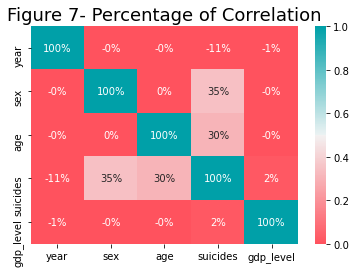

In [70]:
cmap = sns.diverging_palette(10, 200, 100, 60, as_cmap=True)
plt.title('Figure 7- Percentage of Correlation', fontsize=18)
sns.heatmap(heatmap_gf.corr(), annot = True, cmap=cmap, fmt='.0%', vmin=0, vmax=1)
plt.show()

# Normality Check

## distribution of the dependent variable

In [71]:
p = figure(height=350, title="Figure 8- Distribution of Suicides")
y = ffd.suicides
x = np.linspace(min(y) - 50, max(y) + 1, 200)
mu, std = norm.fit(y)
hist, edges = np.histogram(y,bins = 30,  density=True)
p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:],
           fill_color="navy", line_color="white", alpha=0.5, legend_label = "suicide distribution")
pdf = norm.pdf(x, mu, std)
p.line(x, pdf, line_color="#D95B43", line_width=4, alpha=0.7, legend_label = "normal distribution")

vline1 = Span(location=mu, dimension='height', line_color='green', line_width=4)
# vline.set(location = vline.value)
p.line([], [], legend_label = "Mean")
p.renderers.extend([vline1])
robust_mu = ffd.suicides.median()
vline2 = Span(location=robust_mu, dimension='height', line_color='red', line_width=4,line_dash='dashed')
p.line([], [], legend_label = "Robust")
p.xaxis.axis_label = 'Hours'
p.yaxis.axis_label = 'Probobility'
p.renderers.extend([vline2])

show(p)

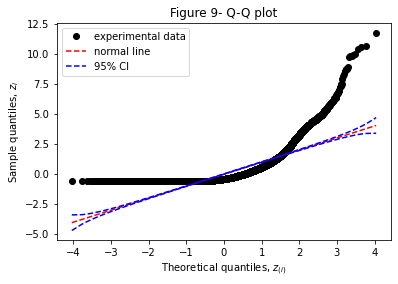

()

In [72]:
###According to Q-Q plot suicides is NOT normally distributed
y = ffd.suicides
def Q_Q_Plot(y):

    n = len(y)
    
    # Calculate order statistic:
    y_os = np.sort(y)
  
    # Estimates of mu and sigma:
    # ML estimates:
    mu = np.mean(y)
    sigma2_ML = np.mean((y - mu)**2)
    sigma_ML = np.sqrt(sigma2_ML) # biased estimate
    s2 = n/(n-1) * sigma2_ML
    sigma = np.sqrt(s2) # unbiased estimate
        
    # Perform z-transform: sample quantiles z.i
    z_i = (y_os - mu)/sigma

    # Calculate cumulative probabilities p.i:
    i = np.array(range(n)) + 1
    p_i = (i - 0.5)/n

    # Calculate theoretical quantiles z.(i):
    from scipy.stats import norm
    z_th = norm.ppf(p_i, 0, 1)

    # Calculate SE or theoretical quantiles:
    SE_z_th = (1/norm.pdf(z_th, 0, 1)) * np.sqrt((p_i * (1 - p_i)) / n)

    # Calculate 95% CI of diagonal line:
    CI_upper = z_th + 1.96 * SE_z_th
    CI_lower = z_th - 1.96 * SE_z_th

    # Make Q-Q plot:
    plt.plot(z_th, z_i, 'o', color='k', label='experimental data')
    plt.plot(z_th, z_th, '--', color='r', label='normal line')
    plt.plot(z_th, CI_upper, '--', color='b', label='95% CI')
    plt.plot(z_th, CI_lower, '--', color='b')
    plt.xlabel('Theoretical quantiles, $z_{(i)}$')
    plt.ylabel('Sample quantiles, $z_i$')
    plt.title('Figure 9- Q-Q plot')
    plt.legend(loc='best')
    plt.show()
    return();
Q_Q_Plot(y)

In [73]:
y = ffd.suicides
k, p = stats.normaltest(y)

print(p)

0.0


## However, the tests and Histogram show that data is not normally distributed. I assume data is Normally distributed according to Central Limit Theorem. In addition, number of observations are a lot and they are independant. so I can use below ANOVA tests;

# Hemogenity Check

In [74]:
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
import statsmodels.stats.multicomp as multi

In [75]:
ffd.sort_values(by='age').hvplot.box(y = 'suicides', by = 'age', color = "magenta")

:BoxWhisker   [age]   (suicides)

In [76]:
## Levene’s test
from scipy.stats import levene
a1 = ffd.query('age == "5-14 years"')['suicides']
a2 = ffd.query('age == "15-24 years"')['suicides']
a3 = ffd.query('age == "25-34 years"')['suicides']
a4 = ffd.query('age == "35-54 years"')['suicides']
a5 = ffd.query('age == "55-74 years"')['suicides']
a6 = ffd.query('age == "75+ years"')['suicides']

stat, p = levene(a1, a2, a3, a4, a5, a6)

# Get the results:
print(stat, p)
print("P-value is less than 0.05 so null hypothesis is rejected: \n age groups have unequal variances")

490.84872845576535 0.0
P-value is less than 0.05 so null hypothesis is rejected: 
 age groups have unequal variances


# ?

In [77]:
my_model = smf.ols(formula='suicides ~ C(age)', data=ffd).fit()
anova_table = anova_lm(my_model, typ=2)
print(anova_table)

                sum_sq       df           F  PR(>F)
C(age)    5.171794e+05      5.0  414.823304     0.0
Residual  4.690259e+06  18810.0         NaN     NaN


In [78]:
compare = multi.MultiComparison(ffd['suicides'], ffd['age'])
result = compare.tukeyhsd()
print(result)

      Multiple Comparison of Means - Tukey HSD, FWER=0.05      
   group1      group2   meandiff p-adj   lower    upper  reject
---------------------------------------------------------------
15-24 years 25-34 years   2.4475  0.001    1.311   3.584   True
15-24 years 35-54 years   4.7084  0.001   3.5719  5.8449   True
15-24 years  5-14 years  -6.2883  0.001  -7.4248 -5.1518   True
15-24 years 55-74 years   5.4502  0.001   4.3137  6.5867   True
15-24 years   75+ years  10.7815  0.001    9.645  11.918   True
25-34 years 35-54 years   2.2609  0.001   1.1244  3.3974   True
25-34 years  5-14 years  -8.7359  0.001  -9.8724 -7.5994   True
25-34 years 55-74 years   3.0026  0.001   1.8661  4.1392   True
25-34 years   75+ years    8.334  0.001   7.1975  9.4705   True
35-54 years  5-14 years -10.9967  0.001 -12.1332 -9.8602   True
35-54 years 55-74 years   0.7418 0.4291  -0.3947  1.8783  False
35-54 years   75+ years   6.0731  0.001   4.9366  7.2096   True
 5-14 years 55-74 years  11.7385  0.001 

### according to above results, it's significantly different (reject = True, PR = 0.0<0.05); so
### Is there a differences in suicides caused by specific age group (yes, no)? yes,age effects suicides statistics.
### and the number of suicides differs in various age groups, except "35-54 years" and "55-74 year"

In [79]:
ffd.hvplot.box(y = 'suicides', by = 'sex', color = "magenta")

:BoxWhisker   [sex]   (suicides)

In [80]:
s1 = ffd.query('sex == "male"')['suicides']
s2 = ffd.query('sex == "female"')['suicides']

stat, p = levene(s1, s2)

print(stat, p)
print("P-value is less than 0.05 so null hypothesis is rejected: \n gender have unequal variances")

3110.5421895340323 0.0
P-value is less than 0.05 so null hypothesis is rejected: 
 gender have unequal variances


In [81]:
my_model = smf.ols(formula='suicides ~ C(sex)', data=ffd).fit()
anova_table = anova_lm(my_model, typ=2)
print(anova_table)

                sum_sq       df           F  PR(>F)
C(sex)    6.221934e+05      1.0  2552.95976     0.0
Residual  4.585245e+06  18814.0         NaN     NaN


In [82]:
compare = multi.MultiComparison(ffd['suicides'], ffd['sex'])
result = compare.tukeyhsd()
print(result)

Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj  lower  upper  reject
--------------------------------------------------
female   male  11.5008 0.001 11.0547 11.947   True
--------------------------------------------------


### according to above results, it's significantly different (reject = True, PR = 0.0<0.05); so
### Is there a differences in suicides caused by specific sex (yes, no)? yes,males effects suicides statistics.
### I also did ttest for proving Hypothesis Althernative:

In [83]:
avs = ffd.groupby(["country", "sex"]).agg({'suicides':"sum"})
yfs = list(avs.loc[( slice(None), 'female'),'suicides'])
yms = list(avs.loc[( slice(None), 'male'),'suicides'])

In [84]:
def my_2sample_ttest(y1, y2, equal_var = False, alternative = 'two.sided'):
    
    from scipy.stats import ttest_ind
    import numpy as np
    
    t_samp, p_value = ttest_ind(y1, y2, equal_var = equal_var)
    y_av_1 = np.mean(y1)
    y_av_2 = np.mean(y2)
    if equal_var == True:
        print('2-sample t-test:')
    else:
        print('Welch t-test:')
    print('y.av.1 = {:.3g}, y.av.2 = {:.3g}'.format(y_av_1, y_av_2))
    print('H0: mu.1 = mu.2')
    if alternative == 'two.sided':
        print('H1: mu.1 != mu.2')
        p_real = p_value
    if alternative == 'less':
        print('H1: mu.1 < mu.2')
        if t_samp <= 0:
            p_real = p_value/2
        else:
            p_real = 1 - p_value/2
    if alternative == 'greater':
        print('H1: mu.1 > mu.2')
        if t_samp >= 0:
            p_real = p_value/2
        else:
            p_real = 1 - p_value/2
    print('t = {:.4g}, p-value = {:.4g}\n'.format(t_samp, p_real))
    return(t_samp, p_real)

my_2sample_ttest(yms, yfs,equal_var = False, alternative = 'two.sided')

Welch t-test:
y.av.1 = 1.48e+03, y.av.2 = 374
H0: mu.1 = mu.2
H1: mu.1 != mu.2
t = 8.368, p-value = 1.922e-13



(8.36814291881467, 1.9215618305115534e-13)

### According to this ttest p-value is less than 0.05, so suicide of distinct gender in different countries is significant.There is a significant difference between effect of sex on suicides.¶

In [85]:
ffd.hvplot.box(y = 'suicides', by = 'continent', color = "magenta")

:BoxWhisker   [continent]   (suicides)

In [86]:
c1 = ffd.query('continent == "Africa"')['suicides']
c2 = ffd.query('continent == "Asia"')['suicides']
c3 = ffd.query('continent == "Australia"')['suicides']
c4 = ffd.query('continent == "Central America"')['suicides']
c5 = ffd.query('continent == "North America"')['suicides']
c6 = ffd.query('continent == "South America"')['suicides']
c7 = ffd.query('continent == "Europe"')['suicides']

stat, p = levene(c1, c2, c3, c4, c5, c6, c7)

# Get the results:
print(stat, p)
print("P-value is less than 0.05 so null hypothesis is rejected: \n continent have unequal variances")

85.7134057484478 2.1099141920501774e-106
P-value is less than 0.05 so null hypothesis is rejected: 
 continent have unequal variances


In [87]:
my_model = smf.ols(formula='suicides ~ C(continent)', data=ffd).fit()
anova_table = anova_lm(my_model, typ=2)
print(anova_table)

                    sum_sq       df           F         PR(>F)
C(continent)  1.614849e+05      6.0  100.323591  9.326133e-125
Residual      5.045953e+06  18809.0         NaN            NaN


In [88]:
compare = multi.MultiComparison(ffd['suicides'], ffd['continent'])
result = compare.tukeyhsd()
print(result)

         Multiple Comparison of Means - Tukey HSD, FWER=0.05          
     group1          group2     meandiff p-adj   lower   upper  reject
----------------------------------------------------------------------
         Africa            Asia   4.4591  0.001  2.5417  6.3765   True
         Africa       Australia   1.4917 0.5501 -0.9729  3.9562  False
         Africa Central America   1.9503 0.0875 -0.1442  4.0448  False
         Africa          Europe   7.6021  0.001  5.7783  9.4259   True
         Africa   North America    0.188    0.9 -1.8471   2.223  False
         Africa   South America   7.6718  0.001  5.5773  9.7663   True
           Asia       Australia  -2.9674  0.001 -4.8848   -1.05   True
           Asia Central America  -2.5088  0.001 -3.9192 -1.0984   True
           Asia          Europe    3.143  0.001  2.1793  4.1066   True
           Asia   North America  -4.2711  0.001 -5.5916 -2.9506   True
           Asia   South America   3.2127  0.001  1.8023  4.6231   True
      

### according to above results, it's significantly different (PR =9.326133e-125<0.05); so
### Is there a differences in suicides caused by specific continent (yes, no)? yes,for those two continent that "reject = True" , continent effects suicides statistics.
### and the number of suicides differs in some continents, such as "Australia" and "South America"
### number of suicides does not differ in some continents, such as "Australia" and " Africa"

In [89]:
ffd.sort_values(by='gdp_level').hvplot.box(y = 'suicides', by = 'gdp_level', color = "magenta")

:BoxWhisker   [gdp_level]   (suicides)

In [90]:
set(ffd.gdp_level)

{'High income', 'Low income', 'Lower-middle income', 'Upper-middle income'}

In [91]:
g1 = ffd.query('gdp_level == "High income"')['suicides']
g2 = ffd.query('gdp_level == "Low income"')['suicides']
g3 = ffd.query('gdp_level == "Lower-middle income"')['suicides']
g4 = ffd.query('gdp_level == "Upper-middle income"')['suicides']

stat, p = levene(g1, g2, g3, g4)

print(stat, p)
print("P-value is less than 0.05 so null hypothesis is rejected: \n gdp_level have unequal variances")

5.37113191658645 0.0010781551756499368
P-value is less than 0.05 so null hypothesis is rejected: 
 gdp_level have unequal variances


In [92]:
my_model = smf.ols(formula='suicides ~ C(gdp_level)', data=ffd).fit()
anova_table = anova_lm(my_model, typ=2)
print(anova_table)

                    sum_sq       df         F    PR(>F)
C(gdp_level)  5.858427e+03      3.0  7.062517  0.000097
Residual      5.201580e+06  18812.0       NaN       NaN


In [93]:
gy_model = smf.ols(formula='suicides ~ C(gdp_level):C(year)', data=ffd).fit()
anova_table = anova_lm(gy_model, typ=2)
print(anova_table)

                            sum_sq       df         F        PR(>F)
C(gdp_level):C(year)  1.575914e+05     63.0  9.256121  1.306774e-73
Residual              5.069858e+06  18760.0       NaN           NaN


C:\Users\a.jalali\anaconda3\lib\site-packages\statsmodels\base\model.py:1832: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 63, but rank is 55
  warnings.warn('covariance of constraints does not have full '


In [94]:
gy_model = smf.ols(formula='suicides ~ C(sex):C(age)', data=ffd).fit()
anova_table = anova_lm(gy_model, typ=2)
print(anova_table)

                     sum_sq       df           F  PR(>F)
C(sex):C(age)  1.348571e+06     11.0  597.408955     0.0
Residual       3.858867e+06  18804.0         NaN     NaN


In [95]:
compare = multi.MultiComparison(ffd['suicides'], ffd['gdp_level'])
result = compare.tukeyhsd()
print(result)

             Multiple Comparison of Means - Tukey HSD, FWER=0.05              
       group1              group2       meandiff p-adj   lower   upper  reject
------------------------------------------------------------------------------
        High income          Low income  -2.0547  0.125 -4.4615   0.352  False
        High income Lower-middle income  -1.2065 0.0068 -2.1655 -0.2474   True
        High income Upper-middle income   0.4849 0.3373 -0.2589  1.2288  False
         Low income Lower-middle income   0.8483 0.8014 -1.6803  3.3769  False
         Low income Upper-middle income   2.5397 0.0394  0.0846  4.9947   True
Lower-middle income Upper-middle income   1.6914  0.001  0.6169  2.7659   True
------------------------------------------------------------------------------


In [96]:
g1 = ffd[ffd.gdp_level =="Low income"]["suicides"]
g2 = ffd[ffd.gdp_level =="Lower-middle income"]["suicides"]
g3 = ffd[ffd.gdp_level =="Upper-middle income"]["suicides"]
g4 = ffd[ffd.gdp_level =="High income"]["suicides"]


In [97]:
my_2sample_ttest(g4, g2,equal_var = False, alternative = 'two.sided')

Welch t-test:
y.av.1 = 9.71, y.av.2 = 8.51
H0: mu.1 = mu.2
H1: mu.1 != mu.2
t = 3.549, p-value = 0.0003915



(3.5489151196351543, 0.0003914834959607476)

In [98]:
my_2sample_ttest(g4, g1,equal_var = False, alternative = 'two.sided')

Welch t-test:
y.av.1 = 9.71, y.av.2 = 7.66
H0: mu.1 = mu.2
H1: mu.1 != mu.2
t = 2.21, p-value = 0.02773



(2.2104741852130383, 0.02773334946016268)

# ???

# Visualisation

In [99]:
years = list(range(2001,2017))
gdp_sum= fd.groupby(['country', 'year']).agg({"gdp": "mean"})
suicide_sum= fd.groupby(['country', 'year']).agg({"suicides": "sum"})

def make_plot(Country):
    data1 = gdp_sum.iloc[gdp_sum.index.get_level_values('country') == Country]
    data2 = suicide_sum.iloc[suicide_sum.index.get_level_values('country') == Country]
    y1 = data1.gdp.to_list()
    newList = np.divide(y1, 1000)
    y2 = data2.suicides.to_list()
    
    p = figure(plot_width =600, plot_height= 500, tools = '', toolbar_location= None,
               title = "Figure 10- comparison Suicides and GDP in every Country")
    p.line(years, newList, line_width=3,
           color = 'green', alpha= 0.5, legend_label= "GDP (K)")
    p.line(years, y2,  line_width=3,
           color = 'magenta', alpha= 0.5, legend_label= "Suicides")


    p.xaxis.axis_label = 'Years'
    p.legend.click_policy = 'hide'
    p.yaxis.axis_label = 'Amount'
    return p

In [100]:
import panel as pn
pn.extension()

columns = list(set(gdp_sum.index.get_level_values(0)))
menu, plot =pn.interact(make_plot, Country = columns)
row = pn.Row(menu, plot)
row

Row
    [0] Column
        [0] Select(name='Country', options=['Georgia', 'Ireland', ...], value='Georgia')
    [1] Row
        [0] Bokeh(Figure, name='interactive03502')

In [101]:
years = list(range(2001,2017))
gdp_sum= fd.groupby(['country', 'year']).agg({"gdp": "mean"})
suicide_sum= fd.groupby(['country', 'year']).agg({"suicides": "sum"})
suicides_per_sex = fd.groupby(['country', 'year', 'sex']).agg({"suicides": "sum"})

def make_plot(Country):
    data1 = gdp_sum.iloc[gdp_sum.index.get_level_values('country') == Country]
    data2 = suicide_sum.iloc[suicide_sum.index.get_level_values('country') == Country]
    data3 = suicides_per_sex.iloc[(suicides_per_sex.index.get_level_values('country') == Country) &
                              (suicides_per_sex.index.get_level_values('sex') == 'male')]
    data4 = suicides_per_sex.iloc[(suicides_per_sex.index.get_level_values('country') == Country) &
                                  (suicides_per_sex.index.get_level_values('sex') == 'female')]
    y1 = data1.gdp.to_list()
    newList = np.divide(y1, 1000)
    y2 = data2.suicides.to_list()
    y3 = data3.suicides.to_list()
    y4 = data4.suicides.to_list()
    
    p = figure(plot_width =600, plot_height= 500, tools = '', toolbar_location= None,
              title = "Figure 11- comparison Suicides per sex and GDP in every Country")
    p.line(years, newList, line_width=3,
           color = 'green', alpha= 0.5, legend_label= "GDP (K)")
    p.line(years, y2,  line_width=3,
           color = 'red', alpha= 0.5, legend_label= "Suicides")
    p.line(years, y3, line_width=3,
           color = 'blue', alpha= 0.5, legend_label= "Men_Suicides")
    p.line(years, y4,  line_width=3,
           color = 'magenta', alpha= 0.5, legend_label= "Women_Suicides")


    p.xaxis.axis_label = 'Years'
    p.legend.click_policy = 'hide'
    p.yaxis.axis_label = 'Amount'
    return p

In [102]:
import panel as pn
pn.extension()

columns = list(set(gdp_sum.index.get_level_values(0)))
menu, plot =pn.interact(make_plot, Country = columns)
row = pn.Row(menu, plot)
row

Row
    [0] Column
        [0] Select(name='Country', options=['Georgia', 'Ireland', ...], value='Georgia')
    [1] Row
        [0] Bokeh(Figure, name='interactive03513')

In [103]:
fd.sort_values(by=['year']).hvplot.bar(x='year', y='suicides', groupby=['country','age', 'sex'],
                                       value_label='suicides', color = "deeppink")

:DynamicMap   [country,age,sex]
   :Bars   [year]   (suicides)

In [104]:
table1 = fd.groupby(['country', 'year', "sex"])['suicides'].sum()
table1

country     year  sex   
Albania     2001  female    16.40
                  male      34.22
            2002  female    16.73
                  male      45.78
            2003  female    29.20
                            ...  
Uzbekistan  2014  male      58.94
            2015  female     0.00
                  male       0.00
            2016  female     0.00
                  male       0.00
Name: suicides, Length: 3136, dtype: float64

In [105]:
table1.hvplot.bar('year', 'suicides', by='sex', stacked=True, groupby="country" ,legend='top_right',
                 height=600, cmap = ["deeppink", "green"])

:DynamicMap   [country]
   :Bars   [year,sex]   (suicides)

In [106]:
table = fd.groupby(['country', 'year', "age"])['suicides'].sum()
td = fd.copy()
td['age'] = pd.Categorical(td['age'], ["5-14 years","15-24 years", "25-34 years","35-54 years", "55-74 years", "75+ years"])
td.sort_values(["year", "age"], inplace = True)
table2 = td.groupby(['country', 'year', "age"])['suicides'].sum()
table2.head(10)

country  year  age        
Albania  2001  5-14 years      2.52
               15-24 years     7.23
               25-34 years    12.45
               35-54 years    12.22
               55-74 years     8.75
               75+ years       7.45
         2002  5-14 years      0.64
               15-24 years    10.77
               25-34 years    14.28
               35-54 years    13.16
Name: suicides, dtype: float64

In [107]:
table2.hvplot.bar('year', 'suicides', by='age', stacked=True, groupby="country" ,legend='top_right',
                 cmap = ["lightblue","red", "deeppink", "green", "yellow", "magenta"], height=600)

:DynamicMap   [country]
   :Bars   [year,age]   (suicides)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
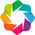

:Layout
   .HoloMap.I  :HoloMap   [country]
      :Curve   [year]   (suicides)
   .HoloMap.II :HoloMap   [country]
      :Curve   [year]   (gdp)

In [108]:
from holoviews import opts
hv.extension('bokeh', 'matplotlib')
vdims = [('suicides', 'Suicides'), ('gdp', 'GDP per Capita')]
ds = hv.Dataset(fd.sort_values("year"), ['year', 'country'], vdims)
ds = ds.aggregate(function=np.sum)
layout = (ds.to(hv.Curve, 'year', 'suicides') + ds.to(hv.Curve, 'year', 'gdp')).cols(1)
layout.opts(opts.Curve(width=600, height=250, framewise=True))

In [109]:
def create_pie_chart_age():
    x = ffd.groupby(['age']).sum().plot(kind='pie', y='suicides', figsize=(5, 5))
    x = x.legend(loc="lower right")

    return x

In [110]:
def create_suicides_all_continent():
    bars = hv.Bars(ffd, kdims=['continent', "sex"]).aggregate(function=np.sum)
    bars.opts(width=800, cmap = ["blue", "deeppink"])
    return bars

In [111]:
def create_pie_chart_sex():
    x = ffd.groupby(['sex']).sum().plot(kind='pie', y='suicides', figsize=(5, 5))
    x = x.legend(loc="lower right")

    return x

<module 'matplotlib.pyplot' from 'C:\\Users\\a.jalali\\anaconda3\\lib\\site-packages\\matplotlib\\pyplot.py'>

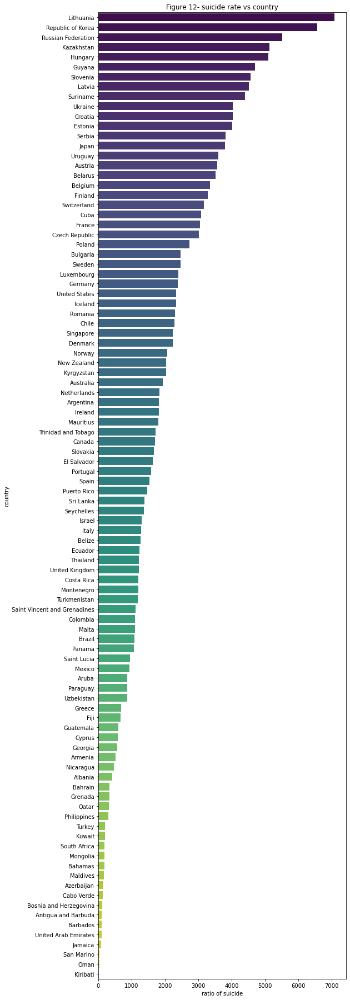

In [112]:
def create_bar_chart_continent():
    
    cs = ffd.groupby("country").agg({"suicides" : "sum"}).sort_values("suicides", ascending = False)
    s = list(cs.suicides)
    c = list(cs.index)
    plt.figure(figsize=(8,32))
    sns.barplot(x=s,y=c, palette="viridis")
    plt.xlabel("ratio of suicide")
    plt.ylabel("country")
    plt.title("Figure 12- suicide rate vs country")
    return plt

create_bar_chart_continent()

In [113]:
# Figure 13- Suicides pie chart 
# in differnet tabs suicides is shown by category
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import ipywidgets as widgets
import numpy as np


out1 = widgets.Output()
out2 = widgets.Output()
out3 = widgets.Output()
out4 = widgets.Output()
out5 = widgets.Output()

tab = widgets.Tab(children = [out1, out2, out3, out4, out5])
tab.set_title(0, 'age')
tab.set_title(1, 'sex')
tab.set_title(2, 'gdp_level')
tab.set_title(3, 'continent')
tab.set_title(4, 'year')
display(tab)

with out1:
    fig1 = ffd.groupby(['age']).sum().plot(kind='pie', y='suicides', figsize=(7, 7))
    plt.show(fig1)

with out2:
    fig2 = ffd.groupby(['sex']).sum().plot(kind='pie', y='suicides', figsize=(5, 5))
    plt.show(fig2)
    
with out3:
    fig3 = ffd.groupby(['gdp_level']).sum().plot(kind='pie', y='suicides', figsize=(7, 7))
    plt.show(fig3)

with out4:
    fig4 = ffd.groupby(['continent']).sum().plot(kind='pie', y='suicides', figsize=(7, 7))
    plt.show(fig4)
    
with out5:
    fig5 = ffd.groupby(['year']).sum().plot(kind='pie', y='suicides', figsize=(7, 7))
    plt.show(fig5)
    
    


In [114]:
def create_gdp_bar():   
    bars = hv.Bars(ffd.sort_values('gdp_level'),
                   kdims='gdp_level').aggregate(function=np.sum).opts(width=600,color = "deeppink",xrotation=30)
                                                                      
                                                                      
    return bars
create_gdp_bar()

:Bars   [gdp_level]   (suicides,gdp,CapitalLatitude,CapitalLongitude)

In [115]:
def create_sex_bar():   
    bars = hv.Bars(ffd,kdims='sex').aggregate(function=np.sum).opts(width=600,color = "sex", cmap=["blue","deeppink"],
                                                                    legend_position = "top", xrotation=30)
                   
                                                                      
    return bars
create_sex_bar()

:Bars   [sex]   (suicides,gdp,CapitalLatitude,CapitalLongitude)

In [116]:
def create_age_bar():   
    bars = hv.Bars(ffd.sort_values("age"),kdims='age').aggregate(function=np.sum).opts(width=600, xrotation=30,legend_cols=False,
                                                                                       color = "deeppink")
                   
                                                                      
    return bars
create_age_bar()

:Bars   [age]   (suicides,gdp,CapitalLatitude,CapitalLongitude)

In [117]:
def create_suicides_per_continent(cont, sa):
    
    fd = ffd.copy()
    fd = fd.drop(["gdp", "CapitalLatitude", "CapitalLongitude"], axis = 1)

    fd['age'] = pd.Categorical(fd['age'], ["5-14 years","15-24 years", "25-34 years","35-54 years", "55-74 years", "75+ years"])
    fd.sort_values(["year", "age"], inplace = True)
    fd = fd[fd.continent == cont]
#     df1 = df.drop(["gdp", "CapitalLatitude", "CapitalLongitude"], axis = 1)
    table1 = fd.groupby(['year', sa])['suicides'].sum()
    p = table1.hvplot.bar('year', 'suicides', by = sa, stacked=True,
                 cmap = [ "deeppink", "green", "lightblue","red", "yellow", "magenta"],
                          height=400).opts(axiswise=True, legend_position='top')
    return p


create_suicides_per_continent("Europe", "age")


:Bars   [year,age]   (suicides)

In [118]:
def create_suicides_barchart_continent(cont):

    df = ffd.sort_values("year").copy()
    df = df[df.continent == cont]
    df1 = df.drop(["gdp", "CapitalLatitude", "CapitalLongitude"], axis = 1)
    df2 = df.drop(["suicides", "CapitalLatitude", "CapitalLongitude"], axis = 1)
    gdp1 = df2.gdp.to_list()
    newlist = np.divide(gdp1, 10)
    df2.gdp = newlist

    list_of_curves = [
        hv.Bars(df1, kdims='year', label='suicides').aggregate(function=np.sum).opts( color = "deeppink", axiswise=True),
        hv.Curve(df2, kdims='year', label='GDP').aggregate(function=np.mean).opts( color = "green", axiswise=True),
    ]
    p = hv.Overlay(list_of_curves).opts(
        responsive=True,
        min_height=400,
        xlabel='Year', 
        ylabel='Amount', 
        title='Suicides and GDP per Continent',
        legend_position='top_left',
        axiswise=True)
    return p
create_suicides_barchart_continent("Australia")

:Overlay
   .Bars.Suicides :Bars   [year]   (suicides)
   .Curve.GDP     :Curve   [year]   (gdp)

In [119]:
def end_of_dashboard():
    print("The End!")
end_of_dashboard()

The End!


In [122]:
#figure 14
def make_suicide_map_1():
    x = ffd.groupby("country").agg({"suicides": "sum", "CapitalLatitude": "mean", "CapitalLongitude": "mean"})
    data = {"country": x.index, "latitude": x.CapitalLatitude, "longitude": x.CapitalLongitude,
        "suicides": x.suicides, "level": np.nan}
    map_df = pd.DataFrame(data)
    map_df.loc[map_df.suicides <2000 , "level"] = "high"
    map_df.loc[map_df.suicides <1000 , "level"] = "low"
    map_df.loc[map_df.suicides >2000 , "level"] = "critical"
    colors = {'low' : 'yellow', 'high' : 'orange', 'critical' : 'red'}
    map_df.dropna(inplace=True)
    map_osm = folium.Map(location=[52.35, 4.916667], zoom_start=6)
    for _, row in map_df.iterrows():
        folium.CircleMarker(location=[row["latitude"], row["longitude"]], 
                            radius=5, fill_color=colors[row['level']]).add_to(map_osm)

        folium.Marker(location=[row["latitude"], row["longitude"]],icon=DivIcon(icon_size=(150,36), icon_anchor=(0,0),
                                   html='<div style="font-size: 16pt; color : {}">{}</div>'.format(colors[row['level']],
                                                                                                   row['level']))).add_to(map_osm)
    return map_osm

make_suicide_map_1()

In [123]:
import folium
import panel as pn

pn.extension(sizing_mode="stretch_width")

def make_suicide_map():
    x = ffd.groupby("country").agg({"suicides": "sum", "CapitalLatitude": "mean", "CapitalLongitude": "mean"})
    data = {"country": x.index, "latitude": x.CapitalLatitude, "longitude": x.CapitalLongitude,
        "suicides": x.suicides, "level": np.nan}
    map_df = pd.DataFrame(data)
    map_df.loc[map_df.suicides <2000 , "level"] = "high"
    map_df.loc[map_df.suicides <1000 , "level"] = "low"
    map_df.loc[map_df.suicides >2000 , "level"] = "critical"
    colors = {'low' : 'yellow', 'high' : 'orange', 'critical' : 'red'}
    map_df.dropna(inplace=True)
    map_osm = folium.Map(location=[52.35, 4.916667], zoom_start=5)
    for _, row in map_df.iterrows():
        folium.CircleMarker(location=[row["latitude"], row["longitude"]], 
                            radius=5, fill_color=colors[row['level']]).add_to(map_osm)

        folium.Marker(location=[row["latitude"], row["longitude"]],icon=DivIcon(icon_size=(150,36), icon_anchor=(0,0),
                                   html='<div style="font-size: 16pt; color : {}">{}</div>'.format(colors[row['level']],
                                                                                                   row['level']))).add_to(map_osm)
#     folium_pane.object = map_osm
    folium_pane = pn.pane.plot.Folium(map_osm, height=400)
    return folium_pane

make_suicide_map()

Folium(Map, height=400)

In [124]:
# Widgets
continent_widget = pn.widgets.Select(name='Continent', options=list(set(ffd.continent)), value = "Asia", width=100, height=50)
sa_widget = pn.widgets.Select(name='age/sex', options=['sex', 'age'], value = "sex", width=100, height=50)

# sex_checkbox = pn.widgets.CheckBoxGroup(
#     name='Block', value=['sex'], options=['male', 'female'],
#     inline=False)

In [127]:
#Binders
gb = pn.bind(create_gdp_bar)
# sb = pn.bind(create_pie_chart_sex)
sb = pn.bind(create_sex_bar)
sa = pn.bind(create_age_bar)

cont_total = pn.bind(create_suicides_barchart_continent, cont = continent_widget)
# cont_sex = pn.bind(create_suicides_per_sex_continent, cont = continent_widget)
cont_sa = pn.bind(create_suicides_per_continent, cont = continent_widget, sa = sa_widget)
wmap = pn.bind(make_suicide_map)
end = pn.bind(end_of_dashboard)

In [128]:
template = pn.template.FastGridTemplate(
    site="Final Assignment", 
    logo = 'https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcRAza1mhNAAlsg6t1NPydQv7NYib57TuEVNYdk088jP-U-c2SQwCtbkRtFvUytyf-p1Vu8&usqp=CAU',
    title="Suicide in the World",
    background_color = 'lightblue',
    accent_base_color = 'deeppink',
    header_background  = 'deeppink', 
    corner_radius = 15,
    fond = 'COMIC SANS MS', 
    sidebar_width = 200, 
    sidebar=[pn.pane.Markdown("## Settings"), continent_widget, sa_widget],
#              , pn.pane.Markdown("## Variables"),biometric_widget, sleep_status_widget,
#              pn.pane.Markdown("### Blocks"), Block_checkbox],
)
template.main[0:3, :3] = pn.Row(gb, sizing_mode="stretch_both")
template.main[0:3, 3:6] = pn.Row(sb, sizing_mode="stretch_both")
template.main[0:3, 6:10] = pn.Row(sa, sizing_mode="stretch_both")
# template.main[0:3, 6:12] = pn.Row(sage, sizing_mode="stretch_both")

# template.main[0:3, :6] = pn.pane.HoloViews(hv.DynamicMap(cont_a), sizing_mode="stretch_both")

template.main[3:6, :10] = pn.Row(cont_total, sizing_mode="stretch_both")

template.main[6:9, :10] = pn.Row(cont_sa, sizing_mode="stretch_both")
template.main[9:12, :10] = pn.Row(wmap)
# template.main[12:14, :10] = pn.Row(wmap)

template.main[14:15, :1] = pn.Row(end, sizing_mode="stretch_both")
template.show()

The End!
Launching server at http://localhost:63390


In [ ]:
hv.Bars(ffd.sort_values('gdp_level'), kdims='gdp_level').aggregate(function=np.sum).opts(width=600, color = "deeppink")


In [129]:
set(ffd.age)

{'15-24 years',
 '25-34 years',
 '35-54 years',
 '5-14 years',
 '55-74 years',
 '75+ years'}